In [23]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.style.use("dark_background")

In [24]:
import torch
import numpy as np
import networkx as nx
import os

In [51]:
results_dir = "../results/2021-09-02_07-49_dist_online_dense_v0"
results_dir2 = "../results/2021-09-02_14-20_dist_online_dense_v1"
results_dir0 = "../results/2021-08-31_16-33_dist_online_dense_v0"
results_dir1 = "../results/2021-09-02_12-01_dist_online_dense_v1"


#results1 = torch.load(os.path.join(results_dir1, "cadmm_results.pt"), map_location=torch.device("cpu"))
results1 = torch.load(os.path.join(results_dir, "cadmm_lin_results.pt"), map_location=torch.device("cpu"))
results2 = torch.load(os.path.join(results_dir1, "cadmm_log_results.pt"), map_location=torch.device("cpu"))
results3 = torch.load(os.path.join(results_dir, "cadmm_const_results.pt"), map_location=torch.device("cpu"))
results1 = torch.load(os.path.join(results_dir2, "cadmm_log_results.pt"), map_location=torch.device("cpu"))
results2 = torch.load(os.path.join(results_dir2, "dsgt_results.pt"), map_location=torch.device("cpu"))
#results_solo = torch.load(os.path.join(results_dir, "solo_results.pt"), map_location=torch.device("cpu"))


['forward_pass_count',
 'train_loss_moving_average',
 'validation_loss',
 'consensus_error',
 'mesh_grid_density',
 'current_epoch',
 'mesh_inputs']

# Validation loss

(3.0, 6.0)

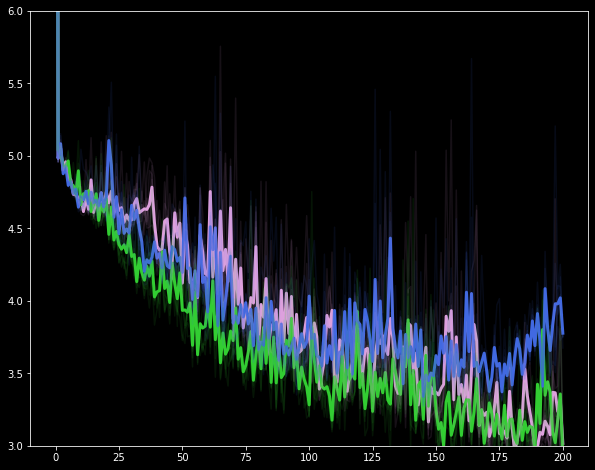

In [52]:
vl1 = torch.stack(results1["validation_loss"])
vl2 = torch.stack(results2["validation_loss"])
vl3 = torch.stack(results3["validation_loss"])

(fig, ax) = plt.subplots(figsize=(10, 8))

t = np.arange(vl1.shape[0])

#for i in results_solo.keys():
#    ax.plot(t, results_solo[i]["validation_loss"] * np.ones_like(t), color="gray")

ax.plot(torch.mean(vl1, dim=1), color="plum", linewidth=3)
ax.plot(torch.mean(vl2, dim=1), color="limegreen", linewidth=3)
ax.plot(torch.mean(vl3, dim=1), color="royalblue", linewidth=3)
ax.plot(vl1, color="plum", alpha=0.1)
ax.plot(vl2, color="limegreen", alpha=0.1)
ax.plot(vl3, color="royalblue", alpha=0.1)
ax.set_ylim([3, 6])
#ax.set_yscale("log")

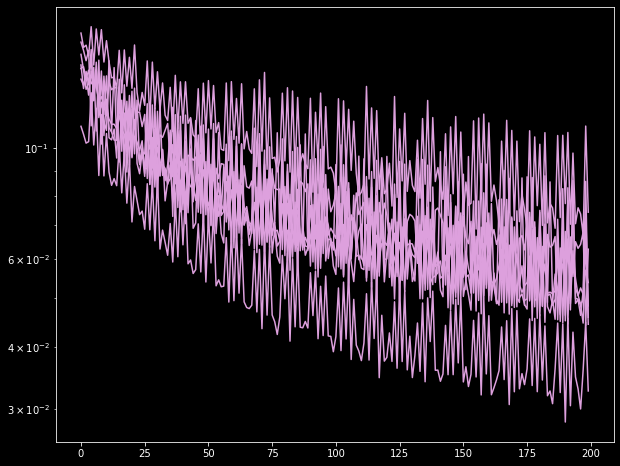

In [54]:
vl1 = torch.stack(results1["train_loss_moving_average"])
vl2 = torch.stack(results2["train_loss_moving_average"])
vl3 = torch.stack(results3["train_loss_moving_average"])

(fig, ax) = plt.subplots(figsize=(10, 8))

t = np.arange(vl1.shape[0])

#for i in results_solo.keys():
#    ax.plot(t, results_solo[i]["validation_loss"] * np.ones_like(t), color="gray")

ax.plot(vl2[1:, :], color="plum")
#ax.plot(vl2[1:, :], color="limegreen")
#ax.plot(vl3[1:, :], color="royalblue")
#ax.set_ylim([3, 6])
ax.set_yscale("log")

# Density Plots

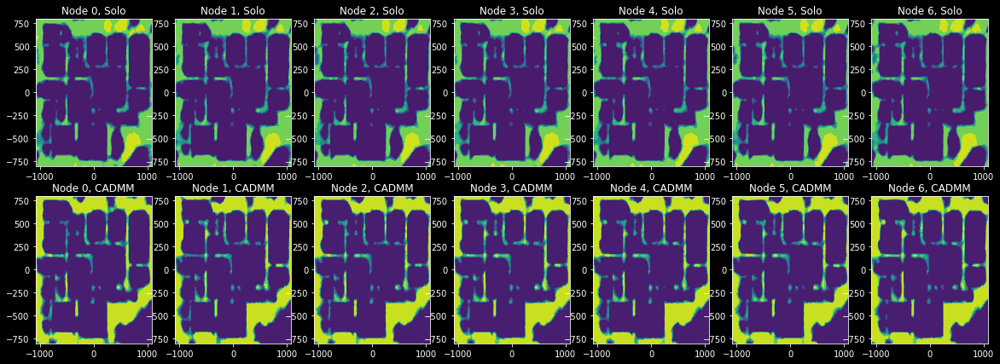

In [53]:
dens1 = results1["mesh_grid_density"]
dens2 = results2["mesh_grid_density"]
locs = results1["mesh_inputs"]

N = 7
(fig, axs) = plt.subplots(nrows=2, ncols=N, figsize=(20, 7))

for i in range(N):
    pred1 = (torch.squeeze(dens1[-1]))[i, :]
    axs[0, i].tricontourf(locs[:, 0], locs[:, 1], pred1)
    axs[0, i].set_title("Node {}, Solo".format(i))
    pred2 = (torch.squeeze(dens2[-1]))[i, :]
    axs[1, i].tricontourf(locs[:, 0], locs[:, 1], pred2)
    axs[1, i].set_title("Node {}, CADMM".format(i))


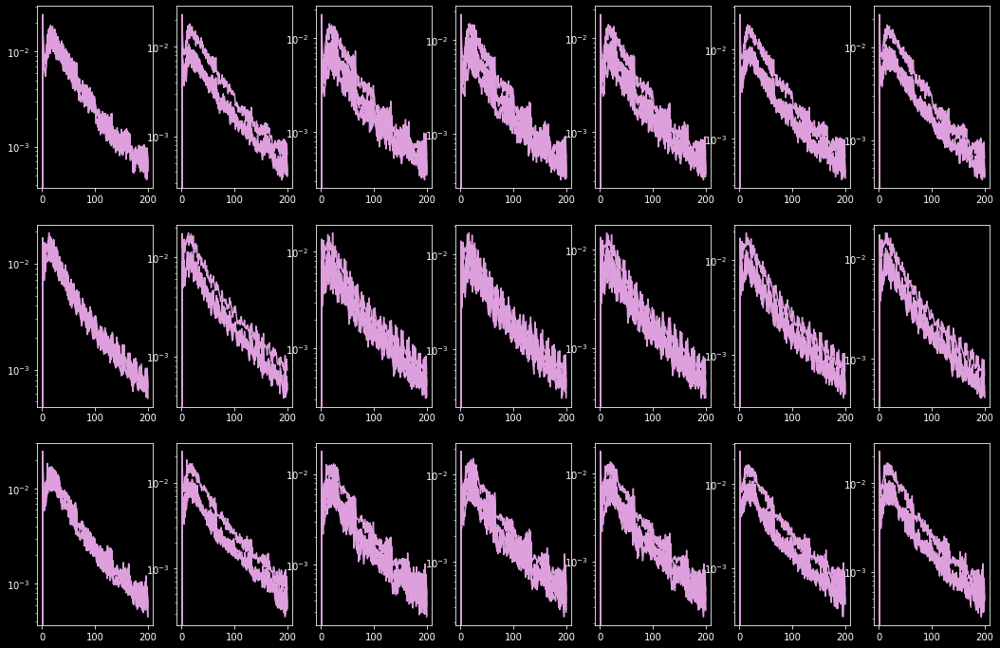

In [55]:
N = 7
(fig, axs) = plt.subplots(ncols=N, nrows=3, figsize=(18, 12))

cea = torch.stack(results1["consensus_error"])
ceb = torch.stack(results2["consensus_error"])
cec = torch.stack(results3["consensus_error"])

ce = [cea, ceb, cec]

for j in range(3):
    for i in range(N):
        for k in range(N):
            if i != k:
                axs[j, i].plot(ce[j][:, i, k], c="plum")
                axs[j, i].set_yscale("log")